### CURRENT DIRECTORY

In [88]:
pwd

'/Users/hunterakers/MachineLearning/my_env'

### Pathing
    a. Baron's Pathing: 
        Main Location: 'C:\\Users\\Baron\\Desktop\\EE_258_Repo\\EE_258\\ML_PATH_EE258\\EE258_env\\projects'
        Dataset: C:\Users\Baron\Documents\Grad_School\EE_258\project
        
    b. Hunter's Pathing: 
        Main Location: '/Users/hunterakers/MachineLearning/my_env'
        Dataset: /Users/hunterakers/MachineLearning/my_env/DATASETS
    

### EE 258 Project Code

Table of Contents
    
    Part a) Preliminary Setup
    Part b) Dataset Description
    Part c) Dataset Visualization
    Part d) Pre Processing
    Part e) BASELINE MODEL: 
    Part f) MODELS UTILIZED: 
    Part g) MODEL IMPROVEMENTS
    Part h) PERFORMANCE & CONCLUSIONS: 
    Part e) 

### Part a) Preliminary Setup
    1. Import Necessary Libraries
    2. Import the Dataset

In [89]:
#1. Import Necessary Liobraries
import pandas as pd 
import numpy as np 
import os

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

In [90]:
#2. Import the Dataset
##  Baron's Path
#dataset_loc = r"C:\Users\Baron\Documents\Grad_School\EE_258\project\CUB_200_2011"

## Hunter's Path (Uncomment as needed)
dataset_loc = r"/Users/hunterakers/MachineLearning/my_env/DATASETS/CUB_200_2011"


# Load key files
images_df = pd.read_csv(f"{dataset_loc}/images.txt", sep=" ", names=["image_id", "filepath"])
labels_df = pd.read_csv(f"{dataset_loc}/image_class_labels.txt", sep=" ", names=["image_id", "class_id"])
classes_df = pd.read_csv(f"{dataset_loc}/classes.txt", sep=" ", names=["class_id", "class_name"])
split_df = pd.read_csv(f"{dataset_loc}/train_test_split.txt", sep=" ", names=["image_id", "is_train"])


# Merge into a single DataFrame
birds_df = images_df.merge(labels_df, on="image_id")
birds_df = birds_df.merge(split_df, on="image_id")
birds_df = birds_df.merge(classes_df, on="class_id")

# Add full image path
birds_df["images_filepath"] = dataset_loc + "/images/" + birds_df["filepath"]


### Part b) Dataset Description

    1. General Info
    2. Describing the Dataset
    3. Head of the Dataset
    4. Describing the characteristicts of the images
    4. Creating General Dataframes (For later use)
    

In [91]:
# 1. General Info
birds_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11788 entries, 0 to 11787
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   image_id         11788 non-null  int64 
 1   filepath         11788 non-null  object
 2   class_id         11788 non-null  int64 
 3   is_train         11788 non-null  int64 
 4   class_name       11788 non-null  object
 5   images_filepath  11788 non-null  object
dtypes: int64(3), object(3)
memory usage: 552.7+ KB


In [92]:
#2. Describing the dataset
birds_df.describe()

,image_id,class_id,is_train
count,11788.000000,11788.000000,11788.000000
mean,5894.500000,101.126315,0.508483
std,3403.046821,57.476826,0.499949
min,1.000000,1.000000,0.000000
25%,2947.750000,51.000000,0.000000
50%,5894.500000,101.000000,1.000000
75%,8841.250000,151.000000,1.000000
max,11788.000000,200.000000,1.000000


In [93]:
#3. Head of the Dataset (Used to see a quick glimpse of the dataset)
birds_df.head(120)

,image_id,filepath,class_id,is_train,class_name,images_filepath
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,001.Black_footed_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,001.Black_footed_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
...,...,...,...,...,...,...
115,116,002.Laysan_Albatross/Laysan_Albatross_0083_756...,2,1,002.Laysan_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
116,117,002.Laysan_Albatross/Laysan_Albatross_0094_101...,2,1,002.Laysan_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
117,118,002.Laysan_Albatross/Laysan_Albatross_0103_504...,2,0,002.Laysan_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...
118,119,002.Laysan_Albatross/Laysan_Albatross_0079_506...,2,0,002.Laysan_Albatross,/Users/hunterakers/MachineLearning/my_env/DATA...


In [94]:
# Get the first 5 unique folder names from birds_df
first_five_folders = birds_df['filepath'].apply(lambda x: x.split('/')[0]).unique()[:5]

# Loop through the folders and count images
for folder in first_five_folders:
    folder_path = os.path.join(dataset_loc, 'images', folder)
    image_count = len([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])
    print(f"The folder '{folder}' contains {image_count} images.")

The folder '001.Black_footed_Albatross' contains 60 images.
The folder '002.Laysan_Albatross' contains 60 images.
The folder '003.Sooty_Albatross' contains 58 images.
The folder '004.Groove_billed_Ani' contains 60 images.
The folder '005.Crested_Auklet' contains 44 images.


In [95]:
from PIL import Image

for i in range(5):
    image_path = birds_df['images_filepath'].iloc[i]
    if os.path.exists(image_path):
        with Image.open(image_path) as img:
            print(img.size)  # Only outputs (width, height)

(500, 335)
(500, 336)
(500, 347)
(415, 500)
(331, 380)


### Part C) Dataset Visualization

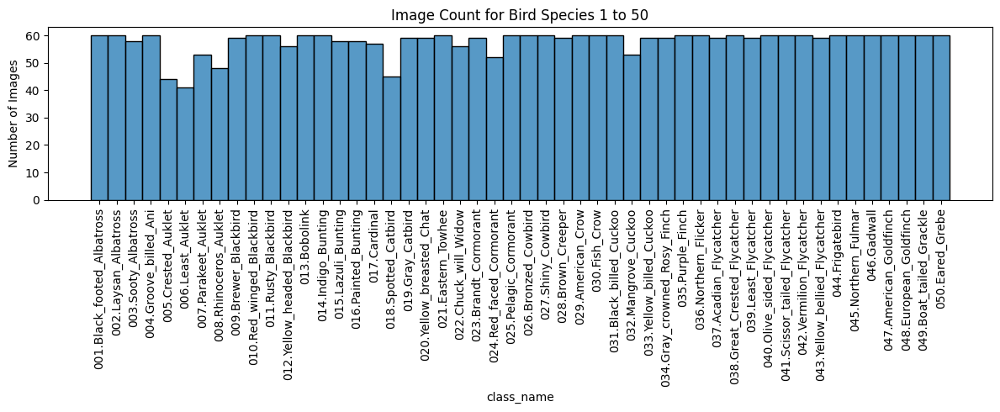

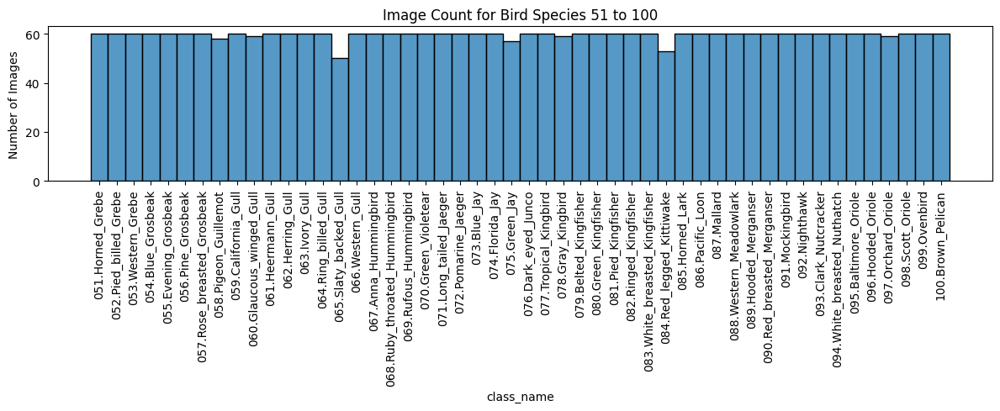

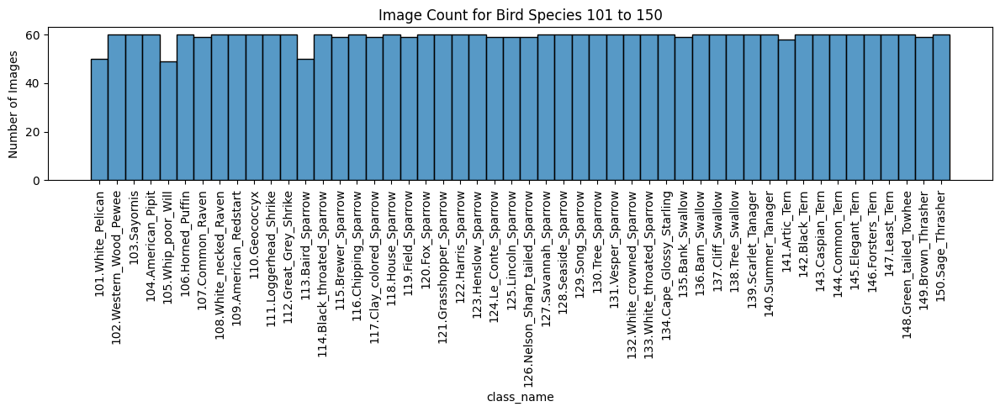

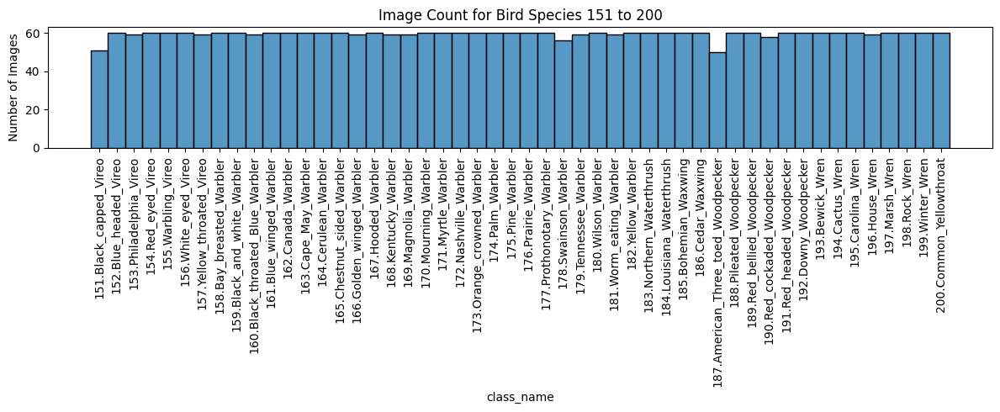

In [96]:
# plt.figure(figsize=(12, 5))
# sns.histplot(birds_df['class_name'], bins=50, kde=False)
# plt.xticks(rotation=90)
# plt.title("Image Count per Bird Species")
# plt.ylabel("Number of Images")
# plt.tight_layout()
# plt.show()

# Get sorted list of unique bird species
unique_classes = birds_df['class_name'].unique()
num_classes = len(unique_classes)
step = 50

for i in range(0, num_classes, step):
    subset = unique_classes[i:i+step]
    plt.figure(figsize=(12, 5))
    sns.histplot(data=birds_df[birds_df['class_name'].isin(subset)],
                 x='class_name', bins=step, kde=False)
    plt.xticks(rotation=90)
    plt.title(f"Image Count for Bird Species {i+1} to {i+step}")
    plt.ylabel("Number of Images")
    plt.tight_layout()
    plt.show()

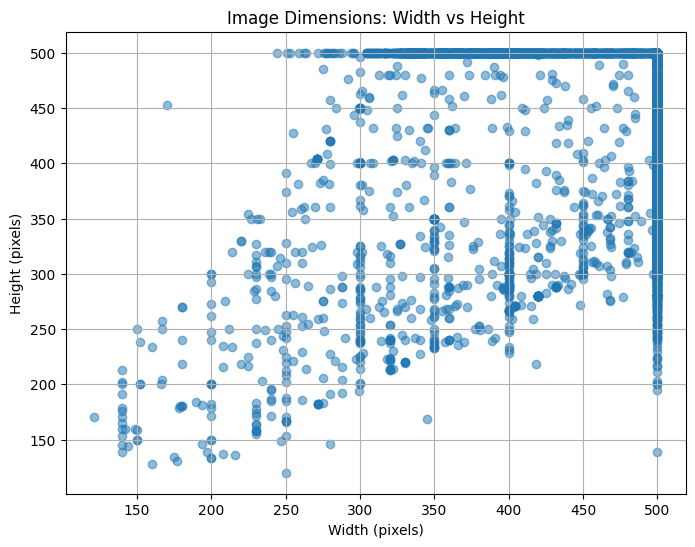

In [97]:
# Lists to hold width and height values
widths = []
heights = []

# Loop through all images
for path in birds_df["images_filepath"]:
    try:
        with Image.open(path) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
    except Exception as e:
        print(f"Skipped {path}: {e}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Image Dimensions: Width vs Height")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid(True)
plt.show()

Found 1004 image(s) with unusual dimensions.


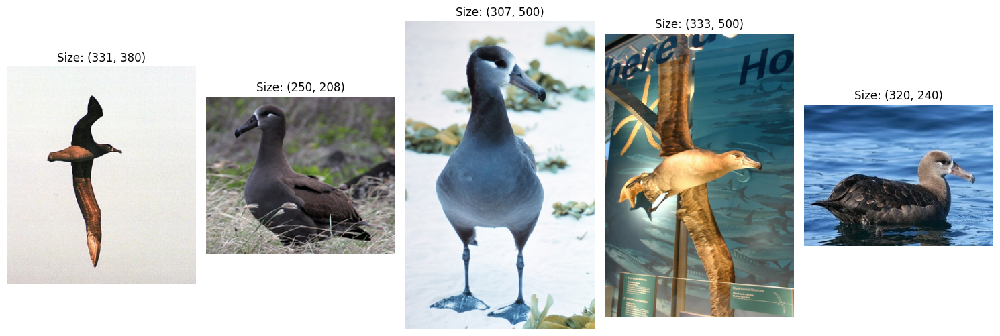

In [98]:
import numpy as np

# Convert to NumPy arrays
widths_arr = np.array(widths)
heights_arr = np.array(heights)

# Calculate mean and standard deviation
w_mean, w_std = widths_arr.mean(), widths_arr.std()
h_mean, h_std = heights_arr.mean(), heights_arr.std()

# Identify images beyond 2 standard deviations in width or height
outlier_indices = [
    i for i, (w, h) in enumerate(zip(widths_arr, heights_arr))
    if abs(w - w_mean) > 2 * w_std or abs(h - h_mean) > 2 * h_std
]

print(f"Found {len(outlier_indices)} image(s) with unusual dimensions.")

# Display a few of the outlier images
from PIL import Image
fig, axes = plt.subplots(1, min(5, len(outlier_indices)), figsize=(15, 5))

for i, idx in enumerate(outlier_indices[:5]):
    path = birds_df.iloc[idx]['images_filepath']
    try:
        img = Image.open(path)
        axes[i].imshow(img)
        axes[i].set_title(f"Size: {img.size}")
        axes[i].axis('off')
    except Exception as e:
        print(f"Failed to open image {path}: {e}")

plt.tight_layout()
plt.show()

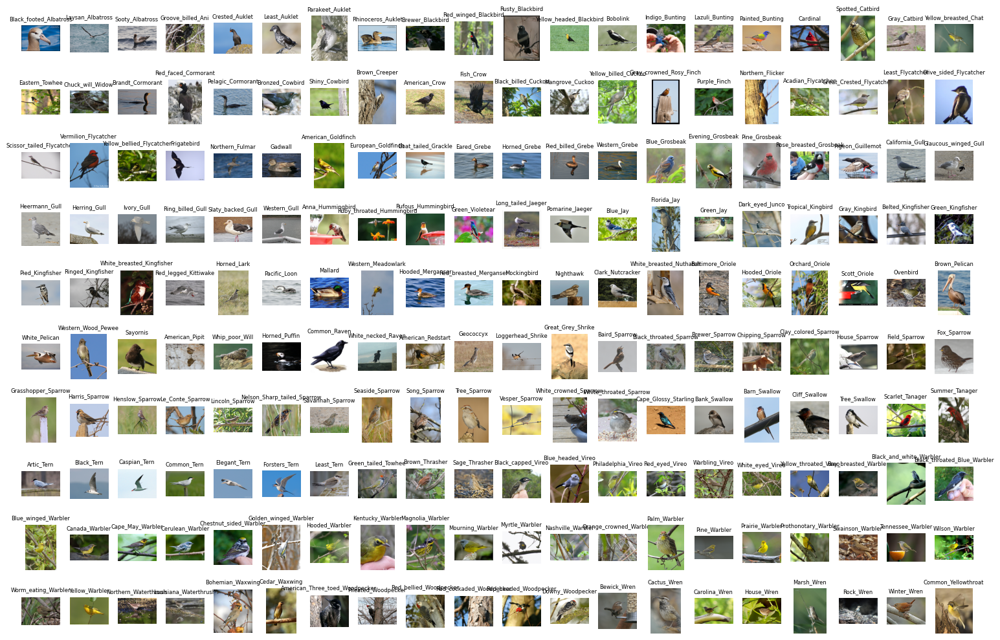

In [99]:
# Number of classes
NUM_CLASSES = birds_df['class_id'].nunique()

# Get one image per class
sample_df = birds_df.groupby('class_id').first().reset_index()

# Grid layout
cols = 20
rows = NUM_CLASSES // cols + int(NUM_CLASSES % cols > 0)
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
axes = axes.flatten()

for i, (_, row) in enumerate(sample_df.iterrows()):
    img = Image.open(row['images_filepath'])
    axes[i].imshow(img)
    axes[i].axis('off')
    # Shorten title by removing class ID prefix (e.g., "001.Red_winged_Blackbird" → "Red_winged_Blackbird")
    class_name = row['class_name'].split('.')[-1]
    axes[i].set_title(class_name, fontsize=6)

# Turn off unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


In [100]:
### Part D) Image Set Preprocessing

In [101]:
from tqdm import tqdm

# Original and new directories
original_dir = os.path.join(dataset_loc, 'images')
processed_dir = os.path.join(dataset_loc, 'images_p')

# Target size
target_size = (500, 375)

# Walk through all subfolders and images
for root, dirs, files in os.walk(original_dir):
    for file in tqdm(files, desc="Processing images"):
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            # Full path to original image
            img_path = os.path.join(root, file)

            # Create corresponding path in new directory
            relative_path = os.path.relpath(img_path, original_dir)
            new_path = os.path.join(processed_dir, relative_path)

            # Create subdirectory if it doesn't exist
            os.makedirs(os.path.dirname(new_path), exist_ok=True)

            try:
                # Open, resize, and save image
                img = Image.open(img_path).convert('RGB')
                img_resized = img.resize(target_size)
                img_resized.save(new_path)
            except Exception as e:
                print(f"Failed to process {img_path}: {e}")

Processing images: 0it [00:00, ?it/s]
Processing images: 100%|███████████████████████| 60/60 [00:00<00:00, 306.90it/s]


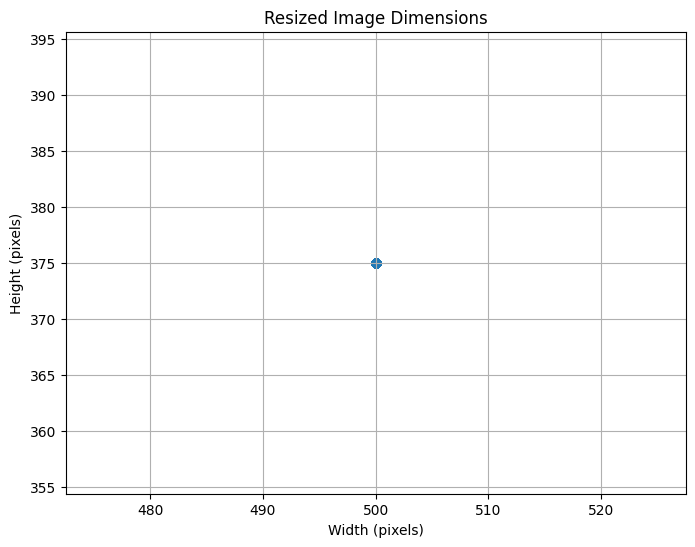

In [102]:
# Use the preprocessed directory
processed_dir = os.path.join(dataset_loc, 'images_p')

# Lists for widths and heights
new_widths = []
new_heights = []

# Walk and check dimensions
for root, dirs, files in os.walk(processed_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(root, file)
            try:
                with Image.open(path) as img:
                    w, h = img.size
                    new_widths.append(w)
                    new_heights.append(h)
            except Exception as e:
                print(f"Error reading {path}: {e}")

# Plot new dimensions
plt.figure(figsize=(8, 6))
plt.scatter(new_widths, new_heights, alpha=0.5)
plt.title("Resized Image Dimensions")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid(True)
plt.show()

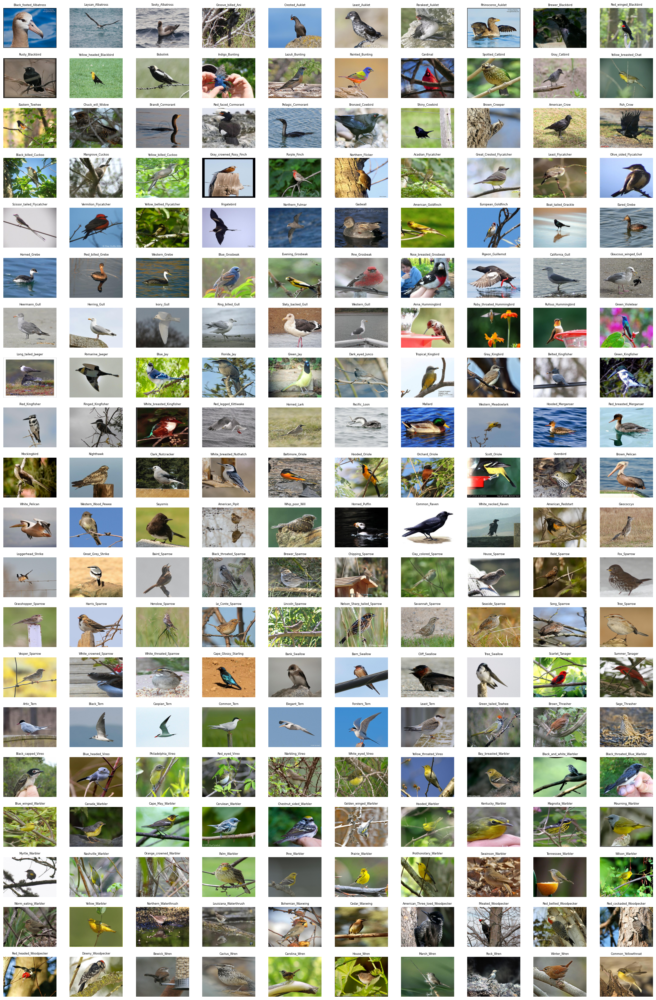

In [103]:
# One image per class
sample_df = birds_df.groupby('class_id').first().reset_index()

cols = 10
rows = len(sample_df) // cols + int(len(sample_df) % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 1.5))
axes = axes.flatten()

for i, (_, row) in enumerate(sample_df.iterrows()):
    img_path = row['images_filepath'].replace('/images/', '/images_p/')
    try:
        img = Image.open(img_path)
        axes[i].imshow(img)
        class_name = row['class_name'].split('.')[-1]
        axes[i].set_title(class_name, fontsize=6)
        axes[i].axis('off')
    except Exception as e:
        print(f"Could not load image {img_path}: {e}")

# Turn off any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

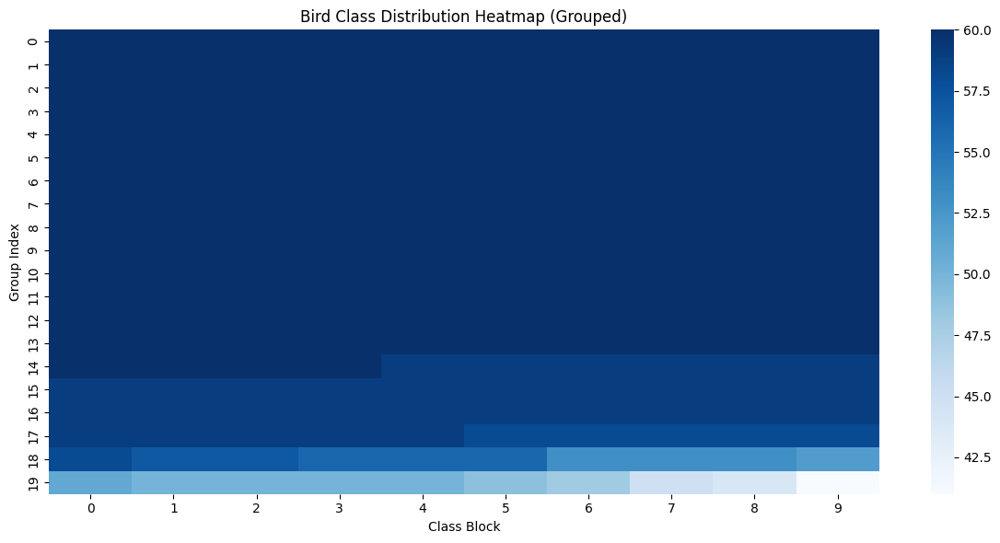

In [104]:
plt.figure(figsize=(12, 6))
class_counts = birds_df['class_name'].value_counts().sort_values(ascending=False)
sns.heatmap(class_counts.values.reshape(20, 10), cmap='Blues', annot=False, cbar=True)
plt.title("Bird Class Distribution Heatmap (Grouped)")
plt.xlabel("Class Block")
plt.ylabel("Group Index")
plt.tight_layout()
plt.show()

/var/folders/vl/_c77jn5n1_z341s0wrbq89_w0000gn/T/ipykernel_52734/3252854528.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top10_df, x='count', y='class_name', ax=ax[0], palette='crest')
/var/folders/vl/_c77jn5n1_z341s0wrbq89_w0000gn/T/ipykernel_52734/3252854528.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom10_df, x='count', y='class_name', ax=ax[1], palette='flare')


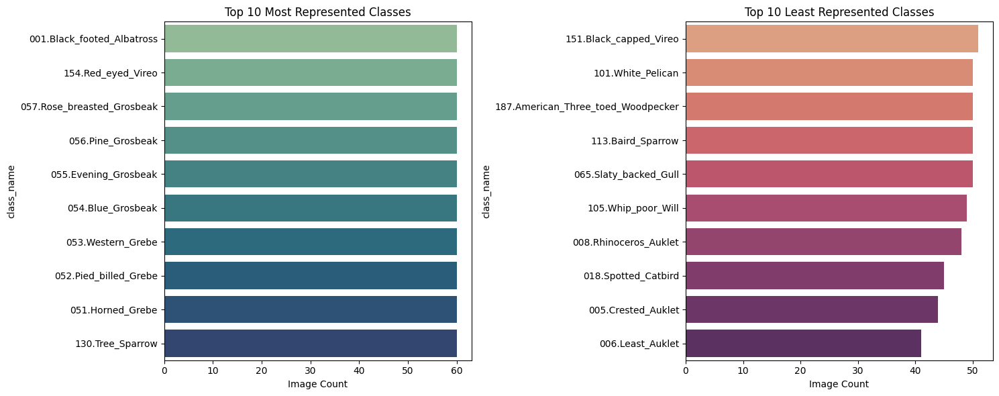

In [105]:
# Reformat class count series to DataFrame
top10_df = class_counts.head(10).reset_index()
top10_df.columns = ['class_name', 'count']

bottom10_df = class_counts.tail(10).reset_index()
bottom10_df.columns = ['class_name', 'count']

# Create plots
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Top 10 Most Represented
sns.barplot(data=top10_df, x='count', y='class_name', ax=ax[0], palette='crest')
ax[0].set_title("Top 10 Most Represented Classes")
ax[0].set_xlabel("Image Count")
ax[0].set_ylabel("class_name")

# Top 10 Least Represented
sns.barplot(data=bottom10_df, x='count', y='class_name', ax=ax[1], palette='flare')
ax[1].set_title("Top 10 Least Represented Classes")
ax[1].set_xlabel("Image Count")
ax[1].set_ylabel("class_name")

plt.tight_layout()
plt.show()

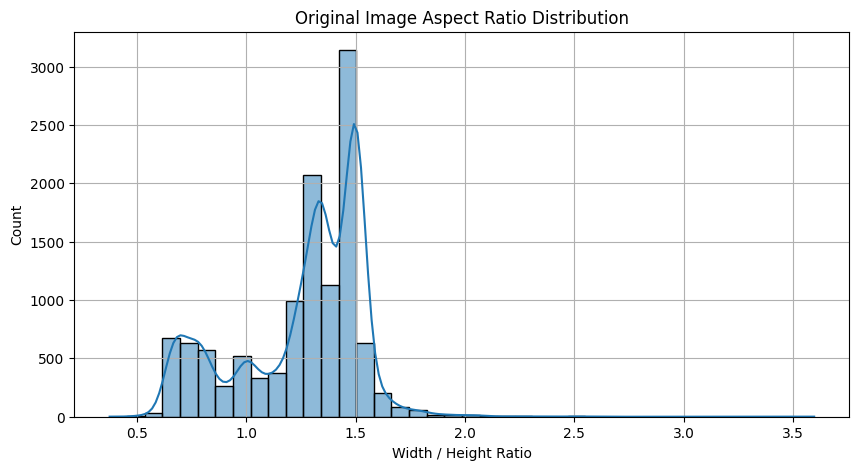

In [106]:
aspect_ratios = [w / h for w, h in zip(widths, heights)]
plt.figure(figsize=(10, 5))
sns.histplot(aspect_ratios, bins=40, kde=True)
plt.title("Original Image Aspect Ratio Distribution")
plt.xlabel("Width / Height Ratio")
plt.ylabel("Count")
plt.grid(True)
plt.show()

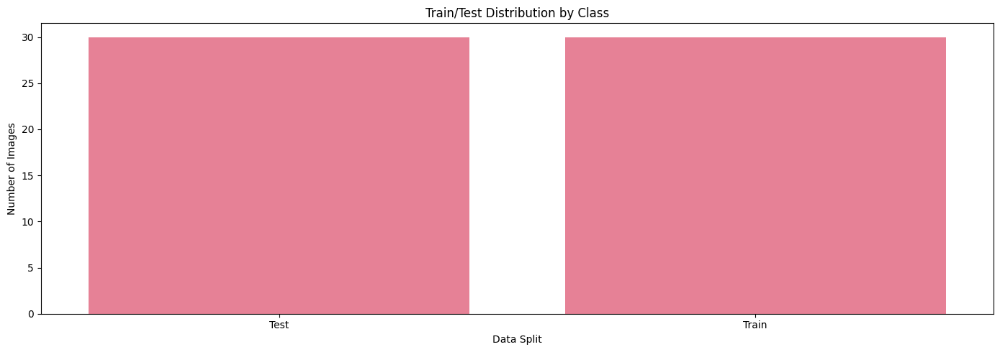

In [107]:
plt.figure(figsize=(14, 5))
sns.countplot(data=birds_df, x='is_train', hue='class_name', dodge=False)
plt.xticks([0, 1], ['Test', 'Train'])
plt.title("Train/Test Distribution by Class")
plt.xlabel("Data Split")
plt.ylabel("Number of Images")
plt.legend([],[], frameon=False)  # Hide legend for clarity
plt.tight_layout()
plt.show()